In [1]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Statistics
include("lattice_BZ.jl")
include("concentrated_BC.jl")

BC_PT (generic function with 1 method)

<font size="12">Single-Particle Concentrated BC</font>

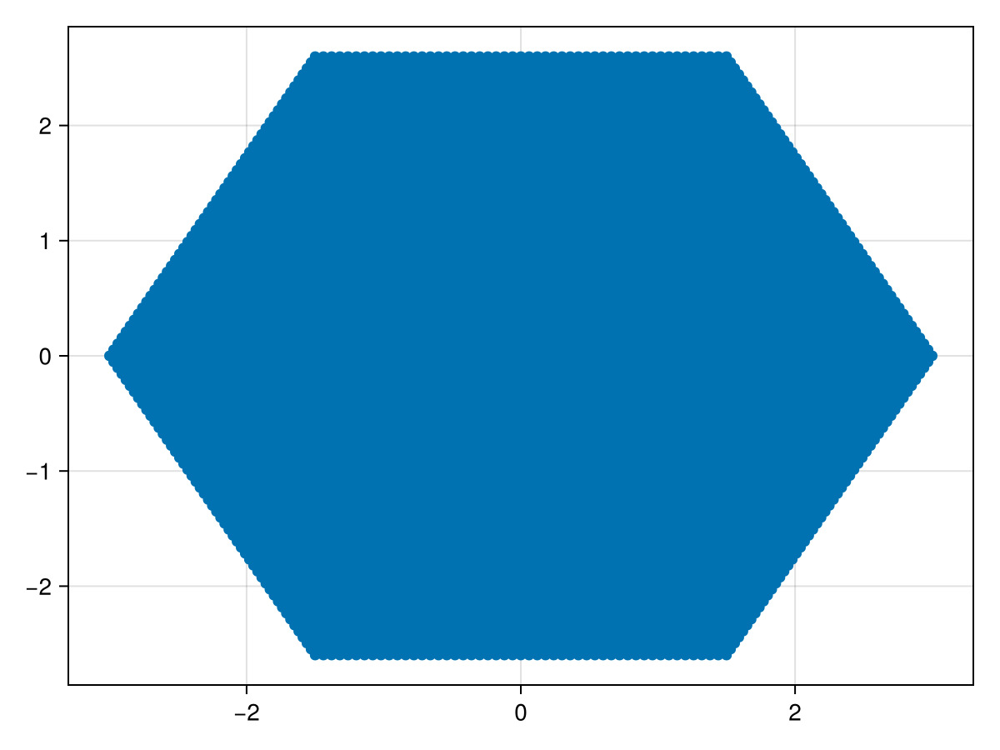

In [2]:
qlim = 3
pd = 50
spacing = 10^(-4) * (qlim / pd)
grid = make_hex([0, 0], qlim, qlim / pd)
# parameters
w = 1
n = 1
P = Figure()
ax1 = Axis(P[1, 1])
scatter!(ax1, grid[:, 1], grid[:, 2])
P

In [3]:
sp_curvature = sp_berry_curvature(grid, spacing, n, w)

7651-element Vector{Float64}:
  2.941086622410765e-12
  6.583916512928738e-8
  2.5280551225925087e-7
 -0.0
 -7.709176254663094e-8
  3.9387840846146114e-7
  2.941086622410765e-12
  3.2384304799364936e-8
  9.992341799640574e-10
 -0.0
  ⋮
 -1.0140131402416711e-8
  1.9464368612193905e-7
  7.520762892914907e-8
 -4.584051136854979e-9
 -3.458041418031905e-7
  2.2946063719386546e-7
  1.1555676393783012e-7
 -5.477935594004283e-7
  8.999063320086899e-8

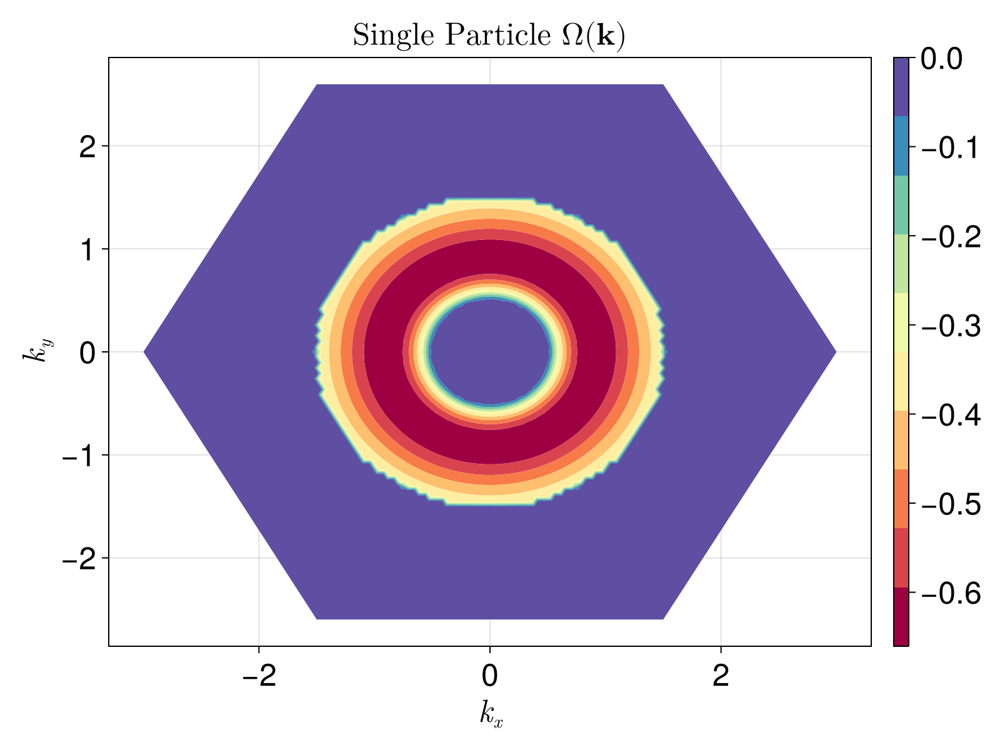

In [4]:
fig = Figure(size=(800, 600), fontsize=25)
    
ax1 = Axis(fig[1, 1], title = L"\text{Single Particle } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
tricontourf!(ax1, grid[:, 1], grid[:, 2], sp_curvature, colormap = :Spectral)
X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], sp_curvature, colormap = :Spectral)
cb1 = Colorbar(fig[1, 2], tr1)

fig

<font size="12">"Mean-field" Berry Curvature</font>

In [5]:
kappa = 1
vF = 0
n = 1
delta = -1
alpha = 503 - 503im

503 - 503im

In [6]:
# Set width
w = 10^(-3) * kappa

0.001

In [7]:
println("Inner radius: " * string(1 - w/2))
println("Outer radius: " * string(1 + w/2))

Inner radius: 0.9995
Outer radius: 1.0005


In [8]:
pd = 50
spacing = 10^(-4) * (w / 2 / pd)
grid = make_hex([0, 0], w / 2, w / 2 / pd)

7651×2 Matrix{Float64}:
 -0.0005    -0.0
  0.00025   -0.000433013
  0.00025    0.000433013
 -0.00049   -0.0
  0.000245  -0.000424352
  0.000245   0.000424352
 -0.00048   -0.0
  0.00024   -0.000415692
  0.00024    0.000415692
 -0.00047   -0.0
  ⋮         
 -0.000295  -0.00035507
 -0.00029   -0.000363731
 -0.000285  -0.000372391
 -0.00028   -0.000381051
 -0.000275  -0.000389711
 -0.00027   -0.000398372
 -0.000265  -0.000407032
 -0.00026   -0.000415692
 -0.000255  -0.000424352

In [9]:
mf_curvature = mf_berry_curvature(grid, spacing, n, w, vF, kappa, delta, alpha)

7651-element Vector{Float64}:
 358231.8304329534
 358230.7383411419
 358235.91249477374
 359302.78605652874
 359296.8736449756
 359300.19107595505
 360343.49709569156
 360341.603102738
 360345.98284538323
 361372.27451596217
      ⋮
 341229.3022806768
 340163.1427371477
 339073.0682572918
 337976.0543607537
 336856.3694222416
 335713.7260527408
 334586.7651144467
 333419.6173067753
 332246.96983329084

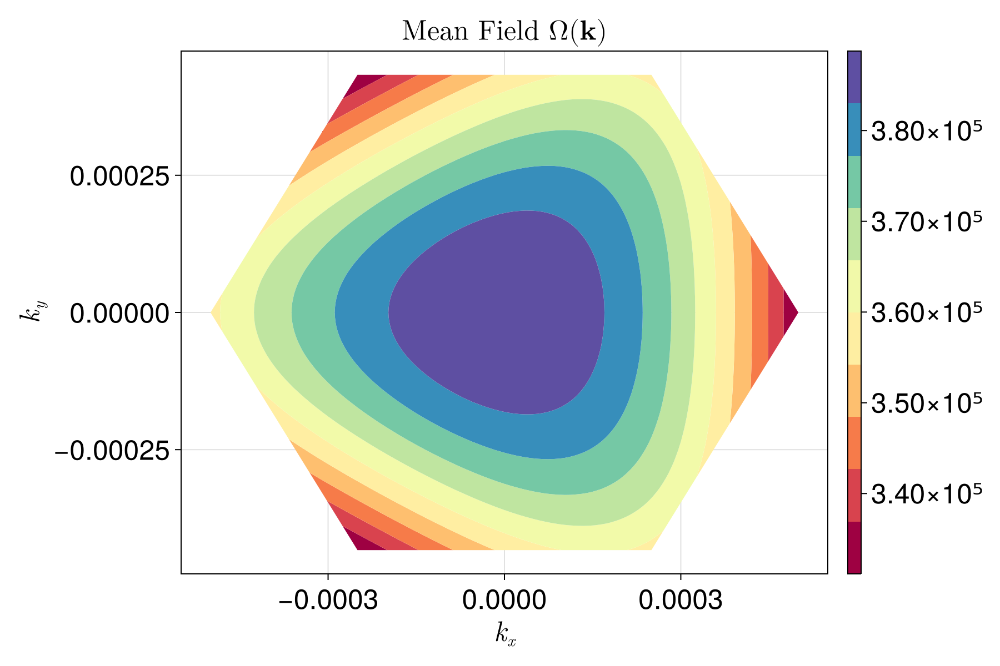

In [10]:
fig = Figure(size=(900, 600), fontsize=25)
    
ax1 = Axis(fig[1, 1], title = L"\text{Mean Field } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
tricontourf!(ax1, grid[:, 1], grid[:, 2], mf_curvature, colormap = :Spectral)
X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], mf_curvature, colormap = :Spectral)
cb1 = Colorbar(fig[1, 2], tr1)

fig

In [11]:
mom_params = Array{Float64}(undef, size(grid)[1], 2)
for j in 1:size(grid)[1]
    mom_params[j, 1] = polar_angle(grid[j, 1], grid[j, 2])
    mom_params[j, 2] = norm(grid[j, :])
end

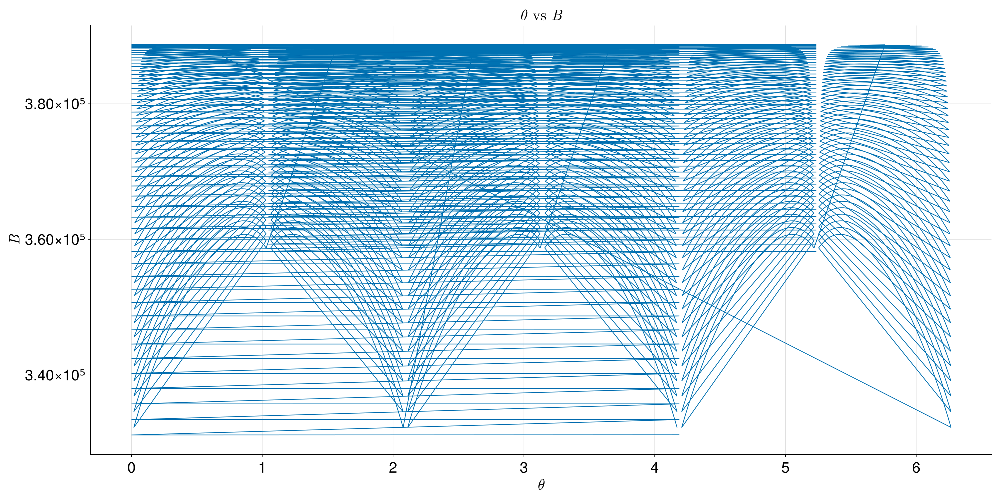

In [12]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"\theta \text{ vs } B", xlabel = L"\theta", ylabel = L"B")
lines!(ax1, mom_params[:, 1], mf_curvature)
P

Here are some observations that I've made about how the various parameters control the Berry curvature:
- For real $\alpha$ and pure imaginary $\alpha$: 
    - Increasing or decreasing $n$ does not alter the shape of the distribution of Berry curvature. All it does is increase or decrease the Berry curvature at every point uniformly.
    - If you limit $\Delta$ such that $\Delta \leq -1$, then nothing really changes for $\Delta$ in this range.
    - $v_F$ decreases the Berry curvature

<font size="12">MF BC Comparison</font>

In [13]:
kappa = 1
vF = 1
n = 1
# note that we want to fix delta < 0 to get non-degenerate GS
delta = -1
# switching the sign of alpha increases or decreases berry curvature
alpha = 1 - 10im

1 - 10im

In [14]:
# Set width
w = 10^(-3) * kappa

0.001

In [15]:
println("Inner radius: " * string(1 - w/2))
println("Outer radius: " * string(1 + w/2))

Inner radius: 0.9995
Outer radius: 1.0005


In [16]:
pd = 50
spacing = 10^(-4) * (w / 2 / pd)
grid = make_hex([0, 0], w / 2, w / 2 / pd)

7651×2 Matrix{Float64}:
 -0.0005    -0.0
  0.00025   -0.000433013
  0.00025    0.000433013
 -0.00049   -0.0
  0.000245  -0.000424352
  0.000245   0.000424352
 -0.00048   -0.0
  0.00024   -0.000415692
  0.00024    0.000415692
 -0.00047   -0.0
  ⋮         
 -0.000295  -0.00035507
 -0.00029   -0.000363731
 -0.000285  -0.000372391
 -0.00028   -0.000381051
 -0.000275  -0.000389711
 -0.00027   -0.000398372
 -0.000265  -0.000407032
 -0.00026   -0.000415692
 -0.000255  -0.000424352

In [17]:
mf_curvature = mf_berry_curvature(grid, spacing, n, w, vF, kappa, delta, alpha)
no_mf_curvature = mf_berry_curvature(grid, spacing, n, w, vF, kappa, 0, 0)
folded_sp_curvature = mf_berry_curvature(grid, spacing, n, w, vF, kappa, 0, 0, true)

7651-element Vector{Float64}:
 -403.4932074463227
 -408.45754083640753
 -408.37453616999755
 -416.593001377134
 -413.0227547557687
 -421.77288475264953
 -422.5832939465142
 -426.5010068486324
 -429.15043745539805
 -433.48393765980853
    ⋮
 -483.0935292009092
 -483.11519679423475
 -475.5279216689454
 -474.17264724415463
 -475.4261309596466
 -470.41010632063944
 -470.3154850097384
 -467.393183338792
 -469.1268316049112

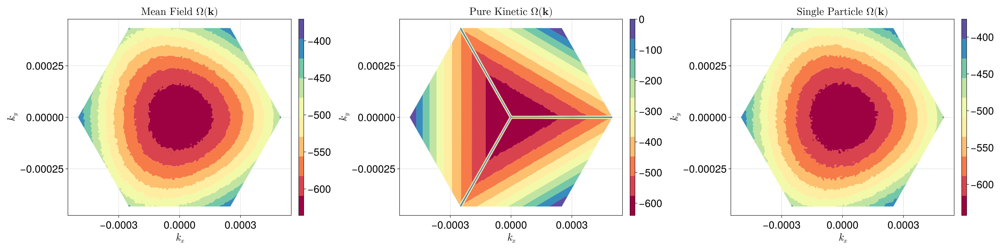

In [18]:
fig = Figure(size=(2400, 600), fontsize=25)
    
ax1 = Axis(fig[1, 1], title = L"\text{Mean Field } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
tricontourf!(ax1, grid[:, 1], grid[:, 2], mf_curvature, colormap = :Spectral)
X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], mf_curvature, colormap = :Spectral)
cb1 = Colorbar(fig[1, 2], tr1)

ax2 = Axis(fig[1, 3], title = L"\text{Pure Kinetic } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
tricontourf!(ax2, grid[:, 1], grid[:, 2], no_mf_curvature, colormap = :Spectral)
X, ax2, tr2 = tricontourf(grid[:, 1], grid[:, 2], no_mf_curvature, colormap = :Spectral)
cb2 = Colorbar(fig[1, 4], tr2)

ax3 = Axis(fig[1, 5], title = L"\text{Single Particle } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
tricontourf!(ax3, grid[:, 1], grid[:, 2], folded_sp_curvature, colormap = :Spectral)
X, ax3, tr3 = tricontourf(grid[:, 1], grid[:, 2], folded_sp_curvature, colormap = :Spectral)
cb3 = Colorbar(fig[1, 6], tr3)

fig

<font size="12">Perturbation Theory Berry Curvature</font>

In [19]:
theta = pi/4

0.7853981633974483

<font size="12">MF BC $\alpha$ Dependence</font>

In [20]:
kappa = 1
vF = 0
n = 1
delta = -1

-1

In [21]:
# Set width
w = 10^(-4) * kappa

0.0001

In [22]:
p = w / 2 / kappa

x = p * cos(theta)
y = p * sin(theta)

3.535533905932738e-5

In [23]:
pd = 50
spacing = 10^(-4) * (p * kappa / pd)
grid = reshape([x, y], (1, 2))

1×2 Matrix{Float64}:
 3.53553e-5  3.53553e-5

In [24]:
alpha_list = range(-510, 510, 1000)

-510.0:1.021021021021021:510.0

In [25]:
re_alpha_curvatures = Array{Float64}(undef, length(alpha_list))
re_alpha_mathematica = Array{Float64}(undef, length(alpha_list))
for i in 1:length(alpha_list)
    re_alpha_curvatures[i] = mf_berry_curvature(grid, spacing, n, w, vF, kappa, delta, alpha_list[i] - 503im)[1]
    re_alpha_mathematica[i] = BC_PT(alpha_list[i] - 503im, delta, n, w, p, theta)
end

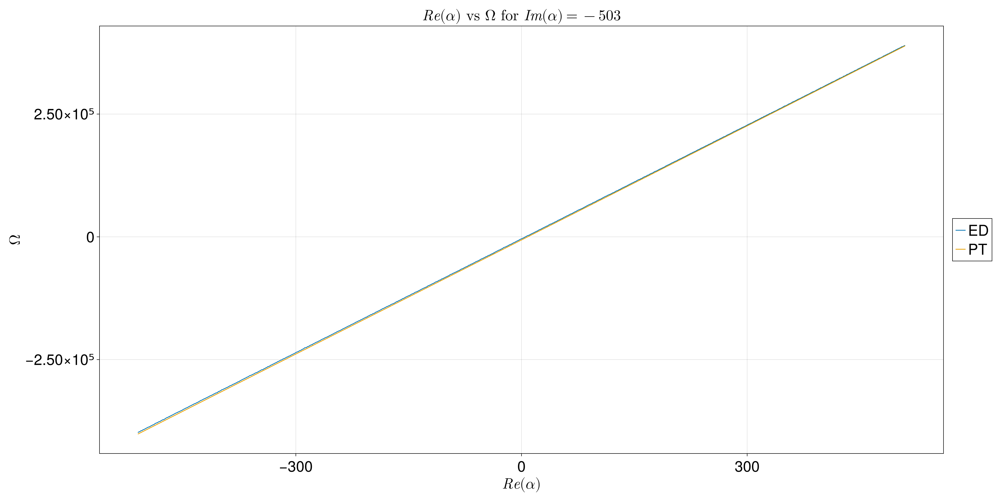

In [26]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"Re(\alpha) \text{ vs } \Omega \text{ for } Im(\alpha) = -503", xlabel = L"Re(\alpha)", ylabel = L"\Omega")
lines!(ax1, alpha_list, re_alpha_curvatures, label = "ED")
lines!(ax1, alpha_list, re_alpha_mathematica, label = "PT")
P[1, 2] = Legend(P, ax1, framevisible = true)
P

In [27]:
im_alpha_curvatures = Array{Float64}(undef, length(alpha_list))
im_alpha_mathematica = Array{Float64}(undef, length(alpha_list))
for i in 1:length(alpha_list)
    im_alpha_curvatures[i] = mf_berry_curvature(grid, spacing, n, w, vF, kappa, delta, alpha_list[i]im + 503)[1]
    im_alpha_mathematica[i] = BC_PT(alpha_list[i]im + 503, delta, n, w, p, theta)
end

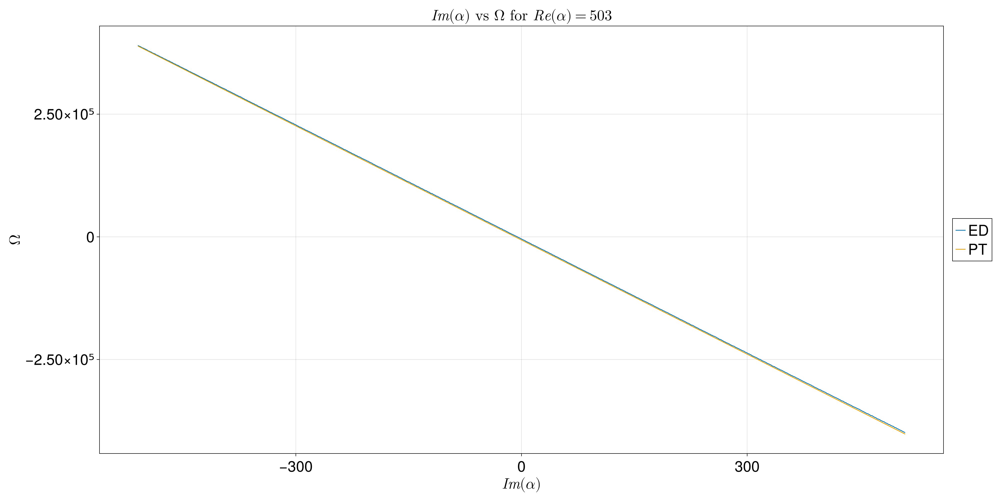

In [28]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"Im(\alpha) \text{ vs } \Omega \text{ for } Re(\alpha) = 503", xlabel = L"Im(\alpha)", ylabel = L"\Omega")
lines!(ax1, alpha_list, im_alpha_curvatures, label = "ED")
lines!(ax1, alpha_list, im_alpha_mathematica, label = "PT")
P[1, 2] = Legend(P, ax1, framevisible = true)
P

<font size="12">MF BC $\Delta$ Dependence</font>

In [29]:
kappa = 1
vF = 0
n = 1
alpha = 503 - 503im

503 - 503im

In [30]:
# Set width
w = 10^(-4) * kappa

0.0001

In [31]:
p = w / 2 / kappa

x = p * cos(theta)
y = p * sin(theta)

3.535533905932738e-5

In [32]:
pd = 50
spacing = 10^(-4) * (p / kappa / pd)
grid = reshape([x, y], (1, 2))

1×2 Matrix{Float64}:
 3.53553e-5  3.53553e-5

In [33]:
delta_list = range(-20, -1, 1000)

-20.0:0.01901901901901902:-1.0

In [34]:
delta_curvatures = Array{Float64}(undef, length(delta_list))
delta_mathematica = Array{Float64}(undef, length(delta_list))
for i in 1:length(delta_list)
    delta_curvatures[i] = mf_berry_curvature(grid, spacing, n, w, vF, kappa, delta_list[i], alpha)[1]
    delta_mathematica[i] = BC_PT(alpha, delta_list[i], n, w, p, theta)
end

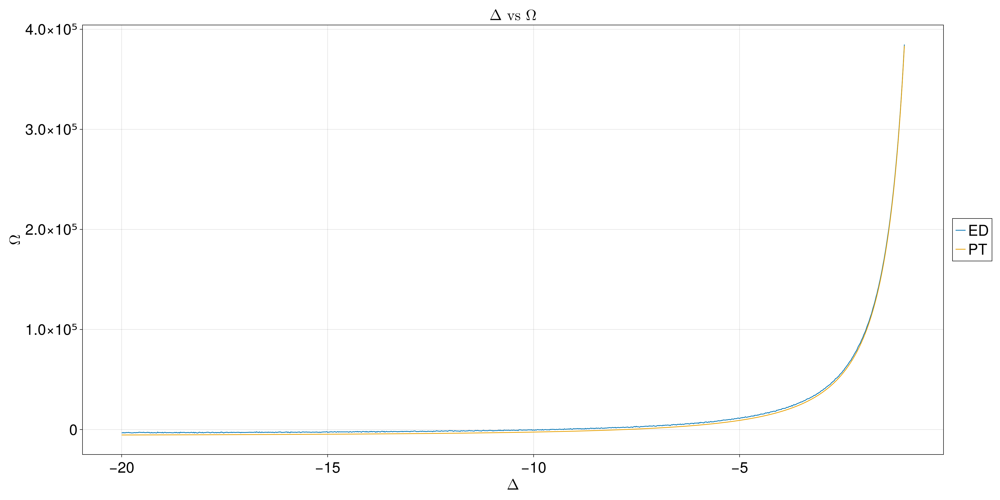

In [35]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"\Delta \text{ vs } \Omega", xlabel = L"\Delta", ylabel = L"\Omega")
lines!(ax1, delta_list, delta_curvatures, label = "ED")
lines!(ax1, delta_list, delta_mathematica, label = "PT")
P[1, 2] = Legend(P, ax1, framevisible = true)
P

<font size="12">MF BC n Dependence</font>

In [36]:
kappa = 1
vF = 0
delta = -1
alpha = 503 - 503im

503 - 503im

In [37]:
# Set width
w = 10^(-4) * kappa

0.0001

In [38]:
p = w / 2 / kappa

x = p * cos(theta)
y = p * sin(theta)

3.535533905932738e-5

In [39]:
pd = 50
spacing = 10^(-4) * (p / kappa / pd)
grid = reshape([x, y], (1, 2))

1×2 Matrix{Float64}:
 3.53553e-5  3.53553e-5

In [40]:
n_list = range(1, 100, 100)

1.0:1.0:100.0

In [41]:
n_curvatures = Array{Float64}(undef, length(n_list))
n_mathematica = Array{Float64}(undef, length(n_list))
for i in 1:length(n_list)
    n_curvatures[i] = mf_berry_curvature(grid, spacing, n_list[i], w, vF, kappa, delta, alpha)[1]
    n_mathematica[i] = BC_PT(alpha, delta, n_list[i], w, p, theta)
end

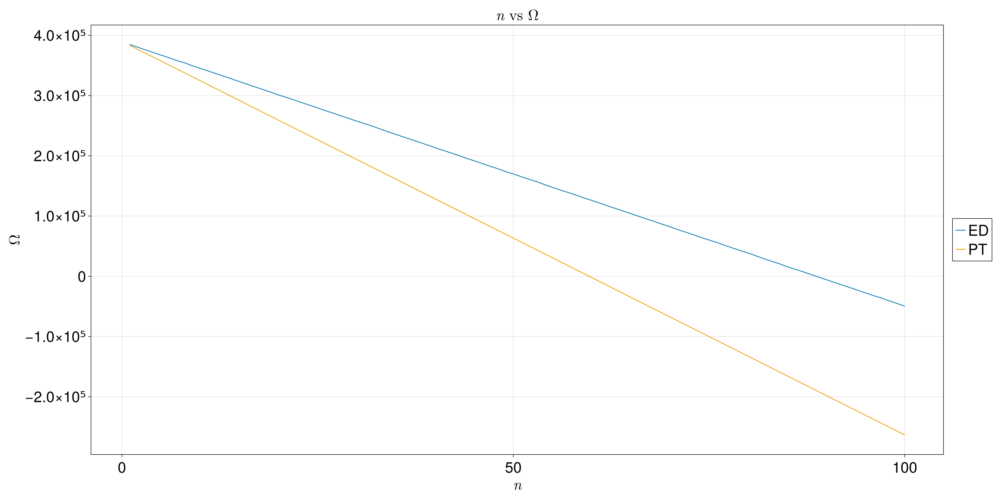

In [42]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"n \text{ vs } \Omega", xlabel = L"n", ylabel = L"\Omega")
lines!(ax1, n_list, n_curvatures, label = "ED")
lines!(ax1, n_list, n_mathematica, label = "PT")
P[1, 2] = Legend(P, ax1, framevisible = true)
P

<font size="12">MF BC w Dependence</font>

In [43]:
kappa = 1
vF = 0
delta = -1
n = 1
alpha = 503 - 503im

503 - 503im

In [44]:
w_list = range(10^(-6) * kappa, 10^(-4) * kappa, 1000)

1.0e-6:9.90990990990991e-8:0.0001

In [45]:
w_curvatures = Array{Float64}(undef, length(w_list))
w_mathematica = Array{Float64}(undef, length(w_list))
for i in 1:length(w_list)
    w = w_list[i]
    
    p = w / 2 / kappa

    x = p * cos(theta)
    y = p * sin(theta)

    pd = 50
    spacing = 10^(-4) * (p / kappa / pd)
    grid = reshape([x, y], (1, 2))

    
    w_curvatures[i] = mf_berry_curvature(grid, spacing, n, w, vF, kappa, delta, alpha)[1]
    w_mathematica[i] = BC_PT(alpha, delta, n, w, p, theta)
end

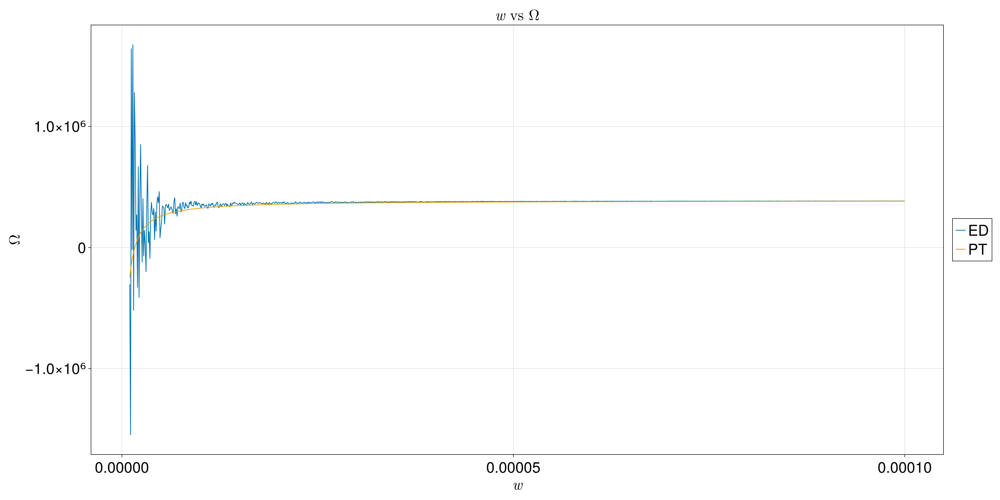

In [46]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"w \text{ vs } \Omega", xlabel = L"w", ylabel = L"\Omega")
lines!(ax1, w_list, w_curvatures, label = "ED")
lines!(ax1, w_list, w_mathematica, label = "PT")
P[1, 2] = Legend(P, ax1, framevisible = true)
P

<font size="12">MF BC q-dependence</font>

In [47]:
kappa = 1
vF = 0
delta = -1
n = 1
alpha = 503 - 503im

503 - 503im

In [48]:
# Set width
w = 10^(-4) * kappa

0.0001

In [49]:
p_list = range(w / 1000 / kappa, w / 2 / kappa, 100)

1.0000000000000001e-7:5.040404040404041e-7:5.0e-5

In [50]:
p_curvatures = Array{Float64}(undef, length(p_list))
p_mathematica = Array{Float64}(undef, length(p_list))
for i in 1:length(p_list)
    x = p_list[i] * cos(theta)
    y = p_list[i] * sin(theta)
    pd = 50
    spacing = 10^(-4) * (p_list[i] / kappa / pd)
    grid = reshape([x, y], (1, 2))

    p_curvatures[i] = mf_berry_curvature(grid, spacing, n, w, vF, kappa, delta, alpha)[1]
    p_mathematica[i] = BC_PT(alpha, delta, n, w, p_list[i], theta)
end

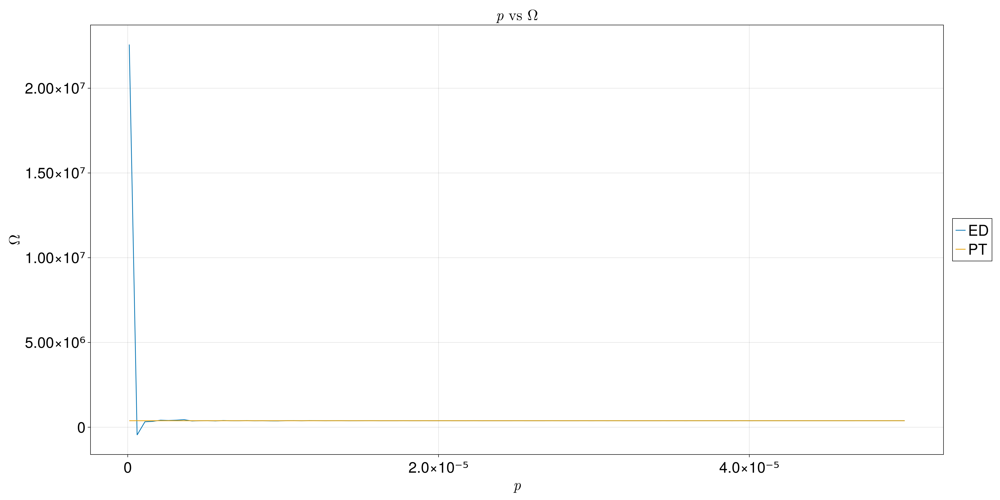

In [51]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"p \text{ vs } \Omega", xlabel = L"p", ylabel = L"\Omega")
lines!(ax1, p_list, p_curvatures, label = "ED")
lines!(ax1, p_list, p_mathematica, label = "PT")
P[1, 2] = Legend(P, ax1, framevisible = true)
P

<font size="12">ED vs PT Comparison</font>

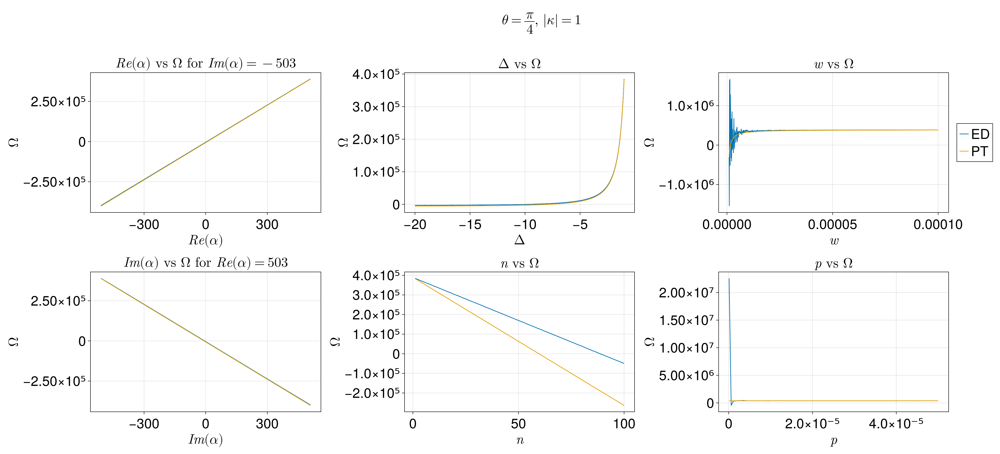

In [52]:
# create plot
P = Figure(size=(2200, 1000), fontsize=30)

# create and configure axes
ax1 = Axis(P[1, 1], title = L"Re(\alpha) \text{ vs } \Omega \text{ for } Im(\alpha) = -503", xlabel = L"Re(\alpha)", ylabel = L"\Omega")
lines!(ax1, alpha_list, re_alpha_curvatures, label = "ED")
lines!(ax1, alpha_list, re_alpha_mathematica, label = "PT")

ax1 = Axis(P[2, 1], title = L"Im(\alpha) \text{ vs } \Omega \text{ for } Re(\alpha) = 503", xlabel = L"Im(\alpha)", ylabel = L"\Omega")
lines!(ax1, alpha_list, im_alpha_curvatures, label = "ED")
lines!(ax1, alpha_list, im_alpha_mathematica, label = "PT")

ax1 = Axis(P[1, 2], title = L"\Delta \text{ vs } \Omega", xlabel = L"\Delta", ylabel = L"\Omega")
lines!(ax1, delta_list, delta_curvatures, label = "ED")
lines!(ax1, delta_list, delta_mathematica, label = "PT")

ax1 = Axis(P[2, 2], title = L"n \text{ vs } \Omega", xlabel = L"n", ylabel = L"\Omega")
lines!(ax1, n_list, n_curvatures, label = "ED")
lines!(ax1, n_list, n_mathematica, label = "PT")

ax1 = Axis(P[1, 3], title = L"w \text{ vs } \Omega", xlabel = L"w", ylabel = L"\Omega")
lines!(ax1, w_list, w_curvatures, label = "ED")
lines!(ax1, w_list, w_mathematica, label = "PT")

ax1 = Axis(P[2, 3], title = L"p \text{ vs } \Omega", xlabel = L"p", ylabel = L"\Omega")
lines!(ax1, p_list, p_curvatures, label = "ED")
lines!(ax1, p_list, p_mathematica, label = "PT")

P[1, 4] = Legend(P, ax1, framevisible = true)

ax = Axis(P[:, :], title = L"\theta = \frac{\pi}{4} \text{, } |\kappa| = 1", titlegap = 80)
hidedecorations!(ax, label = false)
hidespines!(ax)

P


<font size="12">MF BC No Spinors</font>

In [53]:
# Berry curvature over all plaquettes
function bc_no_spinors(points, spacing, vF, kappa, delt, alph, pure_pos = false)
    berry_list = Array{Float64}(undef, size(points)[1])
    for i in 1:size(points)[1]
        # get flux through plaquette centered at point
        angles = Array{Float64}(undef, 4)
        momenta = Array{Float64}(undef, length(angles))
        states = Array{ComplexF64}(undef, length(angles), 3)
        x0 = points[i, 1]
        y0 = points[i, 2]
        for j in 1:length(angles)
            x_new = x0 + spacing * cos(2 * pi * (j - 1) / length(angles))
            y_new = y0 + spacing * sin(2 * pi * (j - 1) / length(angles))
            momentum = norm([x_new, y_new])
            theta = polar_angle(x_new, y_new)
            ham = H_mft(momentum, theta, delt, alph) + H_k(momentum, theta, vF)
            if pure_pos == true
                gs = [1 1 1]
            else
                gs = eigvecs(Hermitian(ham))[:, 1]
            end
            states[j, :] = normalize(gs)
        end
        P = 1
        for j in 1:length(angles)
            if j < length(angles)
                temp = dot(states[j, :], states[j + 1, :])
                P *= temp
            else
                temp = dot(states[j, :], states[1, :])
                P *= temp
            end
            if temp != 0
                P /= abs(temp)
            end
        end
        if abs(imag(P)) < 10^(-14)
            berry_list[i] = -(angle(real(P))) / area(spacing, length(angles))
        else
            berry_list[i] = -angle(P) / area(spacing, length(angles))
        end
    end
    return berry_list
end

bc_no_spinors (generic function with 2 methods)

In [54]:
kappa = 1
vF = 0
delta = -1
alpha = 100000im - 1

-1 + 100000im

In [55]:
# Set width
w = 10^(-4) * kappa

0.0001

In [56]:
pd = 50
spacing = 10^(-2) * (w / 2 / pd)
grid = make_hex([0, 0], w / 2, w / 2 / pd)

7651×2 Matrix{Float64}:
 -5.0e-5   -0.0
  2.5e-5   -4.33013e-5
  2.5e-5    4.33013e-5
 -4.9e-5   -0.0
  2.45e-5  -4.24352e-5
  2.45e-5   4.24352e-5
 -4.8e-5   -0.0
  2.4e-5   -4.15692e-5
  2.4e-5    4.15692e-5
 -4.7e-5   -0.0
  ⋮        
 -2.95e-5  -3.5507e-5
 -2.9e-5   -3.63731e-5
 -2.85e-5  -3.72391e-5
 -2.8e-5   -3.81051e-5
 -2.75e-5  -3.89711e-5
 -2.7e-5   -3.98372e-5
 -2.65e-5  -4.07032e-5
 -2.6e-5   -4.15692e-5
 -2.55e-5  -4.24352e-5

In [57]:
no_spinor_curvature = bc_no_spinors(grid, spacing, vF, kappa, delta, alpha)

7651-element Vector{Float64}:
 276.6295111378378
 276.6553307883731
 276.5405367097354
 293.6142838098907
 293.63630896487575
 293.5455024350089
 312.05246340732157
 312.0636128978348
 312.17650037388927
 332.0333610882244
   ⋮
 350.11876494776027
 342.070901650059
 334.2798926260469
 326.213665658528
 317.91680856107143
 309.59176220750106
 301.4981930177658
 293.14082388597194
 284.8045966953621

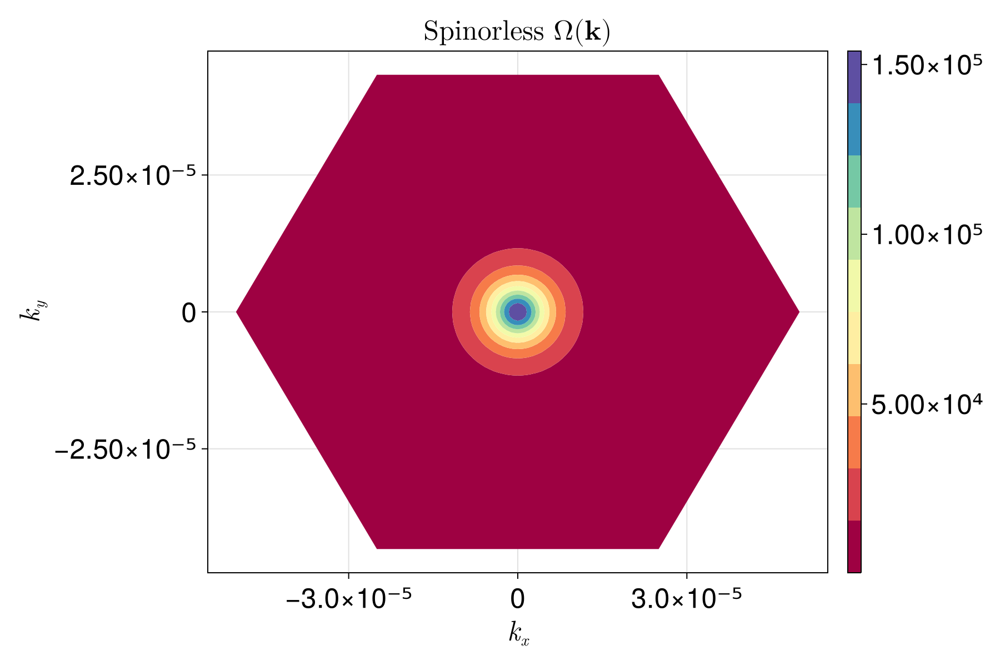

In [58]:
fig = Figure(size=(900, 600), fontsize=25)
    
ax1 = Axis(fig[1, 1], title = L"\text{Spinorless } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
tricontourf!(ax1, grid[:, 1], grid[:, 2], no_spinor_curvature, colormap = :Spectral)
X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], no_spinor_curvature, colormap = :Spectral)
cb1 = Colorbar(fig[1, 2], tr1)

fig

In [59]:
sort_index = sortperm(grid[:, 1])
grid_sorted = grid[sort_index, :]

7651×2 Matrix{Float64}:
 -5.0e-5   -0.0
 -4.95e-5   8.66025e-7
 -4.95e-5  -8.66025e-7
 -4.9e-5   -0.0
 -4.9e-5    1.73205e-6
 -4.9e-5   -1.73205e-6
 -4.85e-5   8.66025e-7
 -4.85e-5  -8.66025e-7
 -4.85e-5  -2.59808e-6
 -4.85e-5   2.59808e-6
  ⋮        
  4.85e-5  -8.66025e-7
  4.85e-5   8.66025e-7
  4.85e-5   2.59808e-6
  4.9e-5   -1.73205e-6
  4.9e-5    0.0
  4.9e-5    1.73205e-6
  4.95e-5  -8.66025e-7
  4.95e-5   8.66025e-7
  5.0e-5    0.0

In [60]:
y_vals = unique(grid[:, 2])
bc_pairs = Array{Float64}(undef, length(y_vals), size(grid, 1), 2)
for j in 1:length(y_vals)
    for i in 1:size(grid, 1)
        if grid_sorted[i, 2] == y_vals[j]
            bc_pairs[j, i, 1] = grid_sorted[i, 1]
            bc_pairs[j, i, 2] = no_spinor_curvature[i]
        end
    end
end

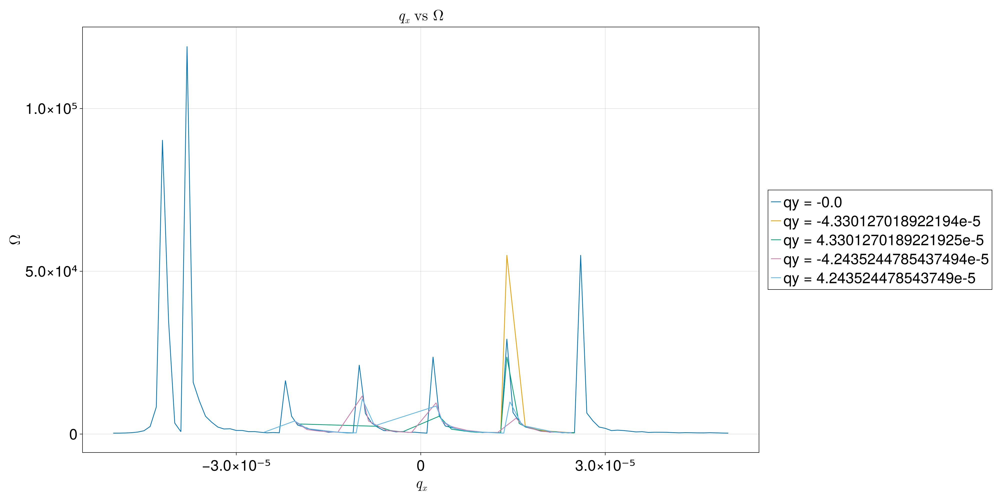

In [61]:
# create plot
P = Figure(size=(2000, 1000), fontsize=30)
# create and configure axes
ax1 = Axis(P[1, 1], title = L"q_x \text{ vs } \Omega", xlabel = L"q_x", ylabel = L"\Omega") 
for j in 1:5
    new_x = Float64[]
    new_bc = Float64[]
    for k in 1:size(grid, 1)
        if bc_pairs[j, k, 1] != 0 || bc_pairs[j, k, 2] != 0
            push!(new_x, bc_pairs[j, k, 1])
            push!(new_bc, bc_pairs[j, k, 2])
        end
    end
    lines!(ax1, new_x, new_bc, label = "qy = " * string(y_vals[j]))
end
P[1, 2] = Legend(P, ax1, framevisible = true)
P